In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras

In [2]:
trainpath = '../input/intel-image-classification/seg_train/'
testpath = '../input/intel-image-classification/seg_test/'
predpath = '../input/intel-image-classification/seg_pred/'

now let's first check the Train folder to have a look to its content



In [3]:
for folder in os.listdir(trainpath + "seg_train"):
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    print(f'for training data , found{len(files)} in folder {folder}')

for training data , found2512 in folder mountain
for training data , found2382 in folder street
for training data , found2191 in folder buildings
for training data , found2274 in folder sea
for training data , found2271 in folder forest
for training data , found2404 in folder glacier


ok , how about the test folder



In [4]:
for folder in os.listdir(testpath + "seg_test"):
    files = gb.glob(pathname=str(testpath+"seg_test//"+folder+"/*.jpg"))
    print(f'For testing data , found {len(files)} in folder {folder}')


For testing data , found 525 in folder mountain
For testing data , found 501 in folder street
For testing data , found 437 in folder buildings
For testing data , found 510 in folder sea
For testing data , found 474 in folder forest
For testing data , found 553 in folder glacier


now for prediction folder



In [5]:
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 7301


now how about the images sizes in train folder



In [6]:
size= []
for folder in os.listdir(trainpath+"seg_train"):
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files:
        image=plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()


(150, 150, 3)    13986
(113, 150, 3)        7
(135, 150, 3)        3
(111, 150, 3)        3
(144, 150, 3)        2
(143, 150, 3)        2
(123, 150, 3)        2
(142, 150, 3)        2
(108, 150, 3)        2
(136, 150, 3)        2
(134, 150, 3)        2
(146, 150, 3)        2
(100, 150, 3)        1
(141, 150, 3)        1
(103, 150, 3)        1
(145, 150, 3)        1
(147, 150, 3)        1
(131, 150, 3)        1
(81, 150, 3)         1
(140, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(124, 150, 3)        1
(149, 150, 3)        1
(110, 150, 3)        1
(105, 150, 3)        1
(97, 150, 3)         1
(120, 150, 3)        1
(76, 150, 3)         1
(119, 150, 3)        1
(102, 150, 3)        1
Name: count, dtype: int64

ok , almost all of them are 150,150,3 , how about test images ?



In [7]:

size = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(81, 150, 3)        1
(131, 150, 3)       1
(141, 150, 3)       1
(149, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(72, 150, 3)        1
Name: count, dtype: int64

now for prediction folder



In [8]:
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 525 in folder mountain
For testing data , found 501 in folder street
For testing data , found 437 in folder buildings
For testing data , found 510 in folder sea
For testing data , found 474 in folder forest
For testing data , found 553 in folder glacier


since we have 6 categories , we first need to create a dictionary with their names & indices , also create a function to get the code back

In [9]:

code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x  


Reading Images
now it's time to read all images & convert it into arrays

first we'll create a variable s , which refer to size , so we can change it easily

let's use now size = 100 , so it will be suitable amount to contain accuracy without losing so much time in training

In [10]:
s = 100


now to read all pictues in six categories in training folder, ans use OpenCV to resize it , and not to forget to assign the y value , from the predefined function



In [11]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image,(s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])
print(f'we have {len(X_train)} items in X_train')


we have 14034 items in X_train



also we have have a look to random pictures in X_train , and to adjust their title using the y value

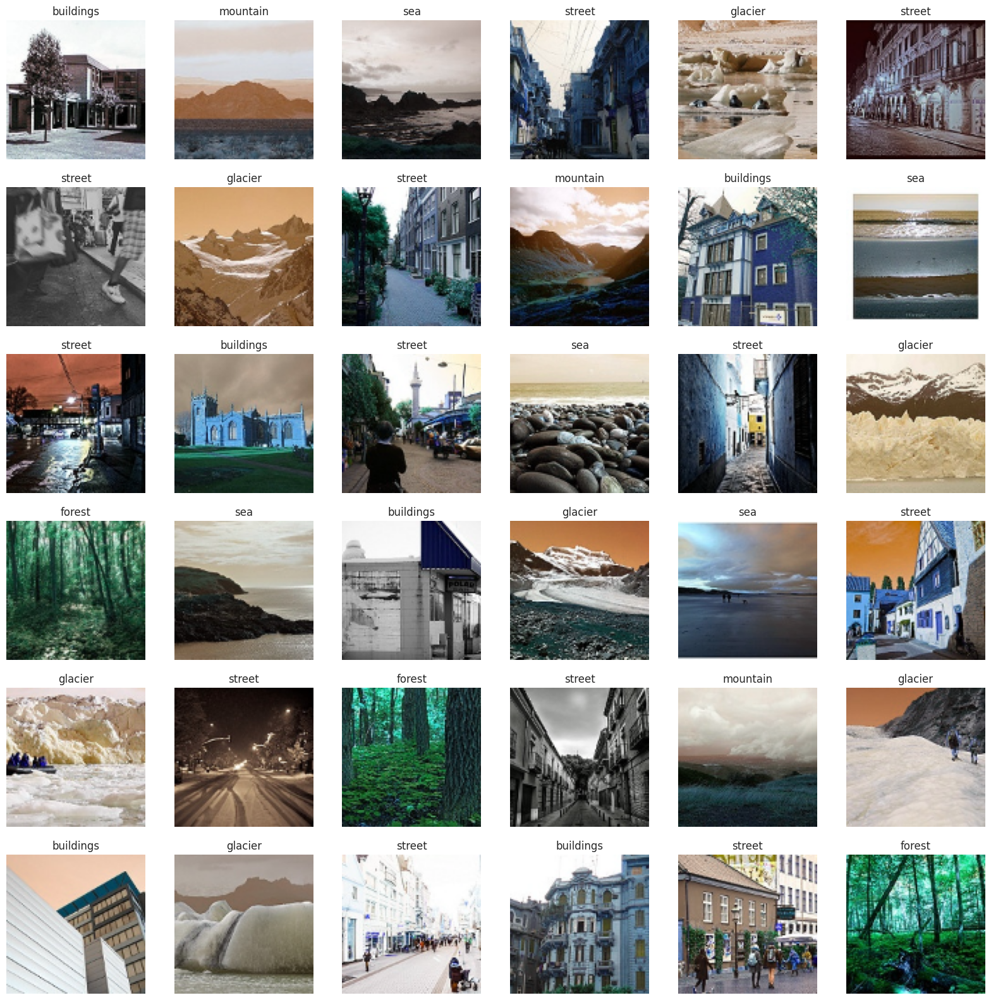

In [12]:
plt.figure(figsize=(20,20))
for n, i in enumerate(list(np.random.randint(0,len(X_train),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))
    

great , now to repeat same steps exactly in test data



In [13]:

X_test = []
y_test = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str(testpath + 'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])
print(f'we have {len(X_test)} items in X_test')


we have 3000 items in X_test


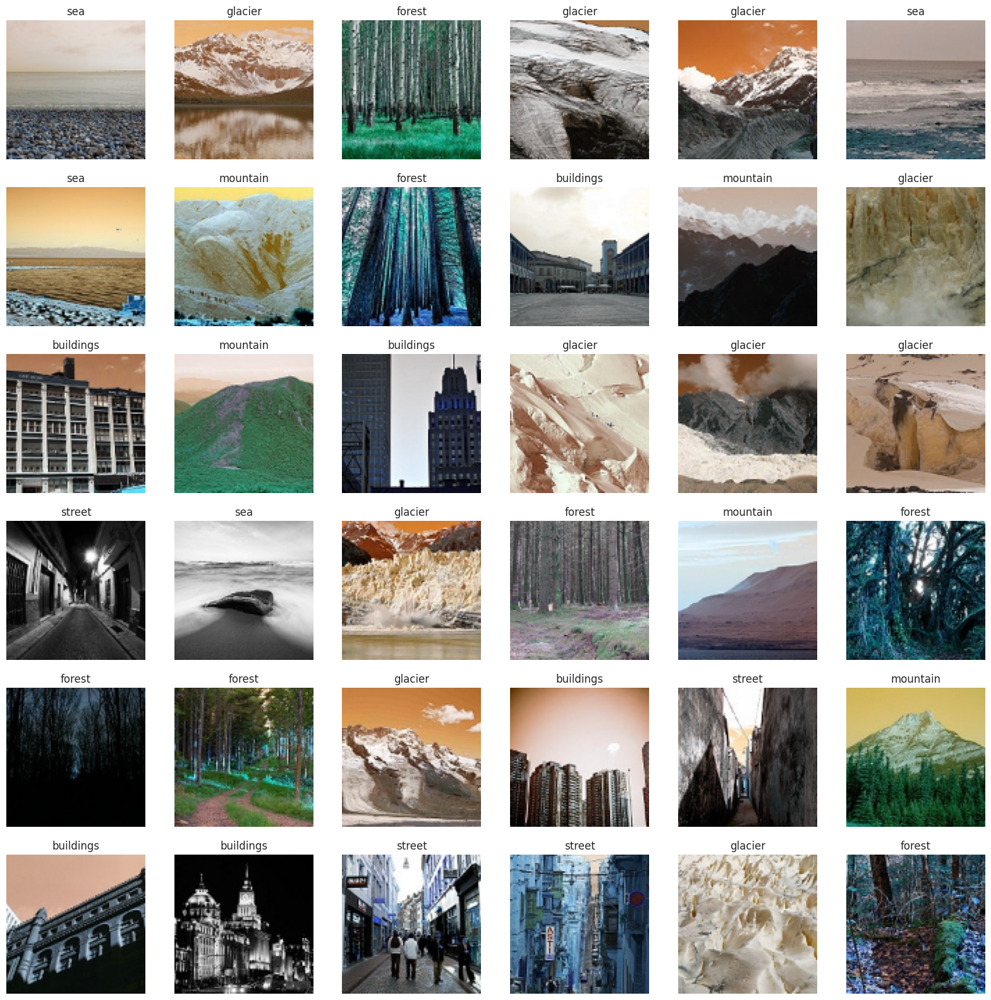

In [14]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

also with Prediction data , without having title ofcourse



In [15]:

X_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))      

In [16]:
print(f'we have {len(X_pred)} items in X_pred')


we have 7301 items in X_pred


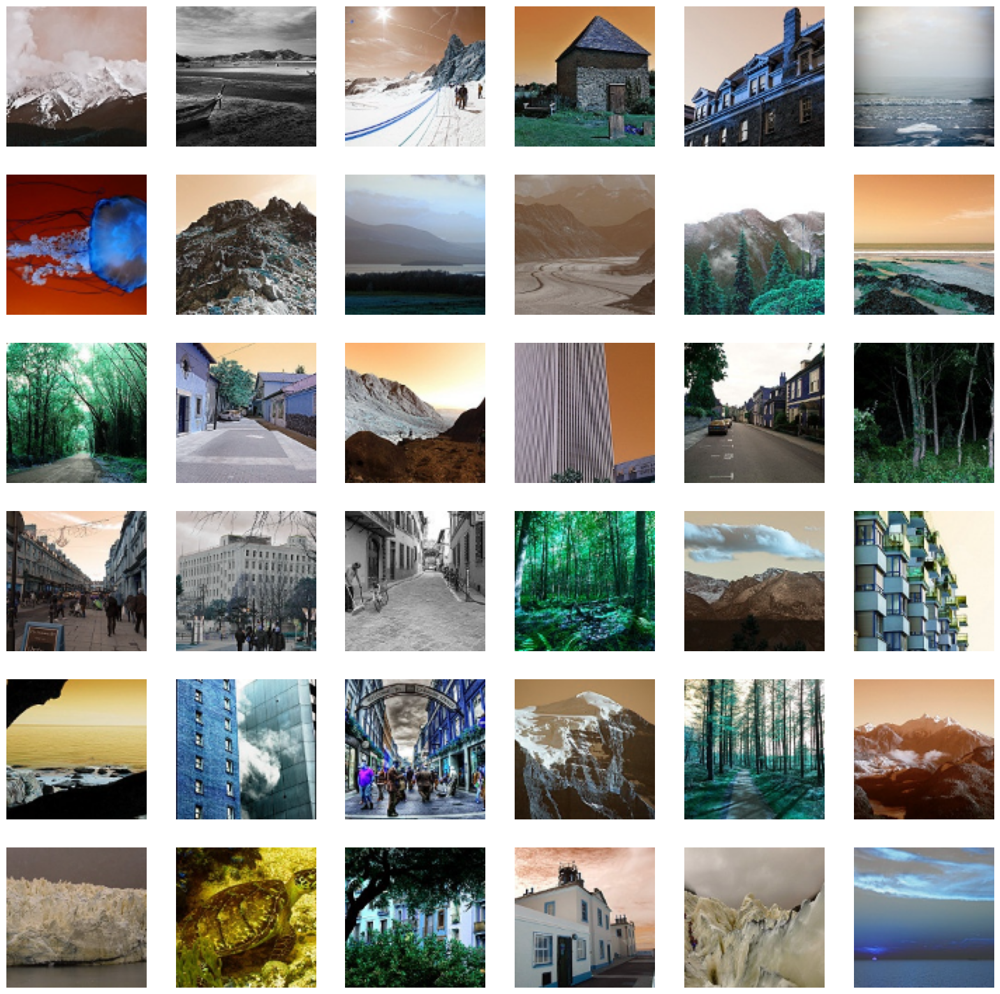

In [17]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')


Building The Model
now we need to build the model to train our data

first to convert the data into arrays using numpy

In [18]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


now to build the CNN model by Keras , using Conv2D layers , MaxPooling & Denses


In [19]:

KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,        
        keras.layers.Dropout(rate=0.5) ,            
        keras.layers.Dense(6,activation='softmax') ,    
        ])


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100


I0000 00:00:1729051245.477097     103 service.cc:145] XLA service 0x7950d40024b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729051245.477152     103 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1729051245.477157     103 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1729051268.583637     103 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


220/220 ━━━━━━━━━━━━━━━━━━━━ 82s 255ms/step - accuracy: 0.3096 - loss: 2.3964
Epoch 2/100
220/220 ━━━━━━━━━━━━━━━━━━━━ 44s 198ms/step - accuracy: 0.5408 - loss: 1.1198
Epoch 3/100
220/220 ━━━━━━━━━━━━━━━━━━━━ 44s 200ms/step - accuracy: 0.6217 - loss: 0.9682
Epoch 4/100
220/220 ━━━━━━━━━━━━━━━━━━━━ 43s 197ms/step - accuracy: 0.6779 - loss: 0.8597
Epoch 5/100
220/220 ━━━━━━━━━━━━━━━━━━━━ 43s 194ms/step - accuracy: 0.7290 - loss: 0.7678
Epoch 6/100
220/220 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - accuracy: 0.7515 - loss: 0.7141
Epoch 7/100
220/220 ━━━━━━━━━━━━━━━━━━━━ 42s 193ms/step - accuracy: 0.7782 - loss: 0.6487
Epoch 8/100
220/220 ━━━━━━━━━━━━━━━━━━━━ 42s 191ms/step - accuracy: 0.7992 - loss: 0.5701
Epoch 9/100
220/220 ━━━━━━━━━━━━━━━━━━━━ 42s 190ms/step - accuracy: 0.8067 - loss: 0.5668
Epoch 10/100
220/220 ━━━━━━━━━━━━━━━━━━━━ 42s 189ms/step - accuracy: 0.8162 - loss: 0.5382
Epoch 11/100
220/220 ━━━━━━━━━━━━━━━━━━━━ 42s 189ms/step - accuracy: 0.8388 - loss: 0.4797
Epoch 12/100
220/220

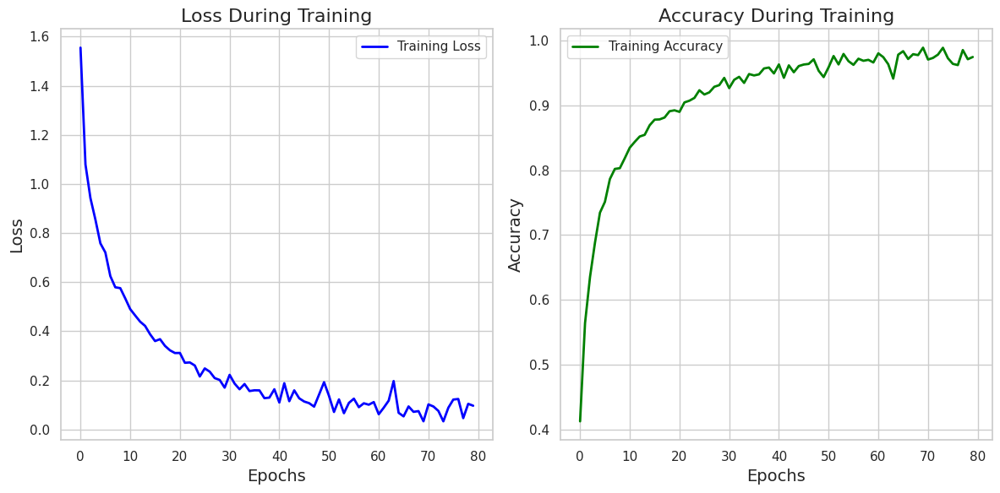

In [22]:
# Compile النموذج
from tensorflow.keras.callbacks import EarlyStopping

KerasModel.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# إعداد Early Stopping لمراقبة الدقة
early_stopping = EarlyStopping(monitor='accuracy', patience=10, restore_best_weights=True)

# تدريب النموذج
history = KerasModel.fit(X_train, y_train, epochs=100, batch_size=64, verbose=1, callbacks=[early_stopping])

# تقييم النموذج
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy))

# رسم منحنى الخسارة والدقة
plt.figure(figsize=(12, 6))

# رسم منحنى الخسارة
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss', color='blue', linestyle='-', linewidth=2)
plt.title('Loss During Training', fontsize=16)
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.grid(True)
plt.legend()

# رسم منحنى الدقة
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy', color='green', linestyle='-', linewidth=2)
plt.title('Accuracy During Training', fontsize=16)
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

In [23]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.7885 - loss: 2.3451
Test Loss is 1.8459923267364502
Test Accuracy is 0.8296666741371155


In [24]:
print('Model Details are : ')
print(KerasModel.summary())

Model Details are : 


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 200)    │         5,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 96, 96, 150)    │       270,150 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 150)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 22, 22, 120)    │       162,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 20, 20, 80)     │        86,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 18, 18, 50)     │        36,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 4, 4, 50)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 800)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │        96,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        12,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,021,930 (7.71 MB)

 Trainable params: 673,976 (2.57 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,347,954 (5.14 MB)

None


In [25]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step
Prediction Shape is (3000, 6)


In [26]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

229/229 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step
Prediction Shape is (7301, 6)


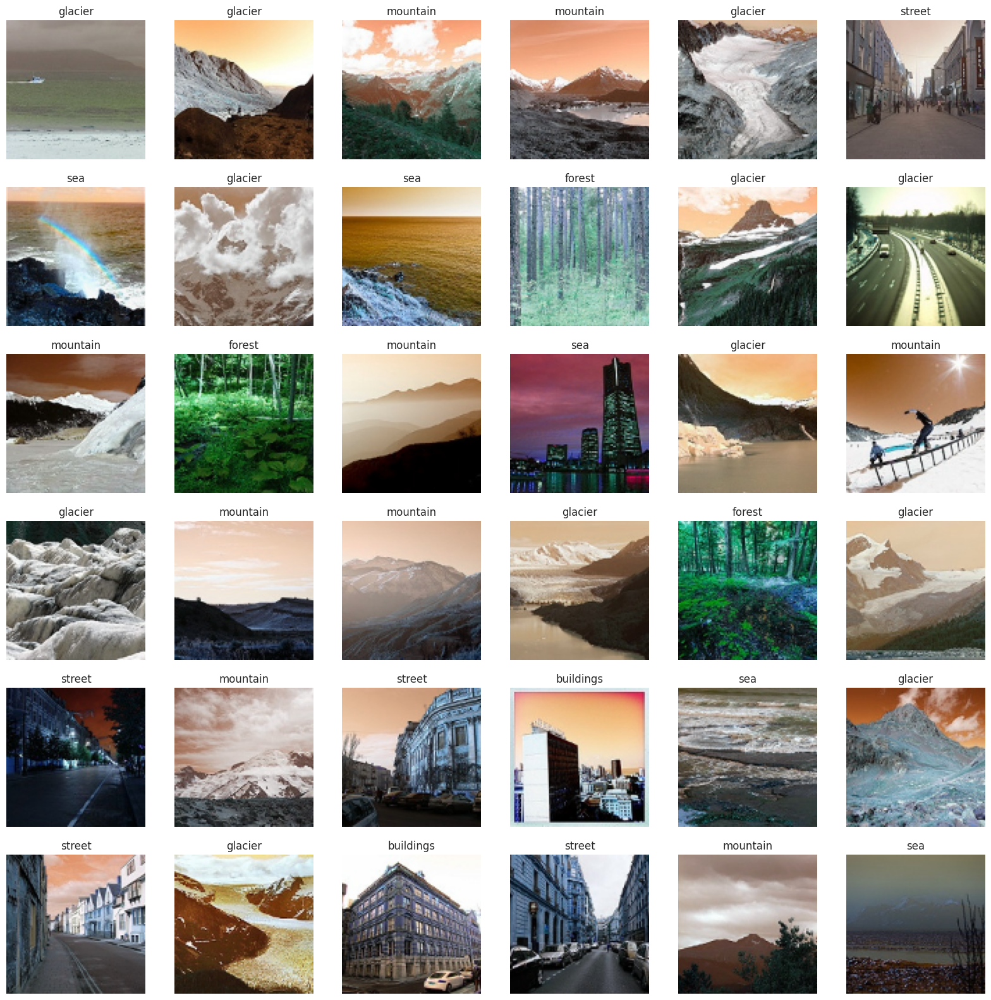

In [27]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))